In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import cufflinks as cf

from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist

from collections import Counter

from sklearn.manifold import TSNE

import re
import razdel
from pymystem3 import Mystem
import tqdm

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering, SpectralClustering, AffinityPropagation,DBSCAN
from sklearn.decomposition import PCA

from sklearn.metrics import silhouette_score,davies_bouldin_score

import numpy as np


from sklearn.linear_model import LogisticRegressionCV,LogisticRegression

## Data Load

In [35]:
df = pd.read_csv('yandex_output.csv', encoding='utf-8',sep=',')
df2 = pd.read_csv('neberitrubku_output.csv', encoding='utf-8',sep=',')

In [36]:
df.head(5)


,company_categories,company_features,company_links,company_name,company_url,phone_number,source
0,Спецтехника и спецавтомобили;Услуги грузчиков;...,коммунальная техника,https://vk.com/pr.bratsk,Компания Персональное решение,NaN,73953274827,Yandex API
1,Агентство недвижимости,NaN,NaN,АН Индустриальное,NaN,79028351016,Yandex API
2,Стоматологическая поликлиника;Стоматологическа...,детская;услуги,https://vk.com/club129411917;http://izhevsk.st...,Стоматология 32 Жемчужины,NaN,79120189455,Yandex API
3,Аптека,оплата картой,NaN,Аптека для бережливых,NaN,78124426652,Yandex API
4,"Регистрационная палата;Министерства, ведомства...",NaN,https://twitter.com/rosreestr_info;https://vk....,Межрайонный отдел № 2 г. Перми Управления Роср...,NaN,73422836588,Yandex API


In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1920 entries, 0 to 1919
Data columns (total 7 columns):
company_categories    1920 non-null object
company_features      942 non-null object
company_links         797 non-null object
company_name          1920 non-null object
company_url           0 non-null float64
phone_number          1920 non-null int64
source                1920 non-null object
dtypes: float64(1), int64(1), object(5)
memory usage: 105.1+ KB


In [8]:
# def get_core(x):
#     if x is not np.nan:
#         part = re.search(r'https?://(www\.)?([a-zA-Z._]+)\.\w+/',x) #\.\w+
#         if part:
#             return part.group(2)
#     else:
#         return 'unknown'
    
# df['company_links'] = df['company_links'].apply(get_core)

In [38]:
# удаляем неинформативные колонки
df.drop(['company_url','source'],inplace=True,axis=1)

In [42]:
# Собираем основные информационные признаки в один
df['full_description'] = df['company_categories'].astype('str') +';'+ df['company_features'].fillna('').astype('str')

In [39]:
df2.head(5)

,categories,descriptions,phone_number,source,titles
0,1x Немой звонок;1x Колл-центр,отрицательно,79294347795,neberitrubku.ru,Колл-центр;Немой звонок
1,1x Немой звонок;1x Нежелательный звонок,"Кто-то звонил, когда я не мог брать трубку, в ...",79299041246,neberitrubku.ru,Немой звонок;Нежелательный звонок
2,10x Сборщик задолженностей;3x Колл-центр;1x Се...,"dfhkjx, nkgz. nmgz cbngx bnml;dfhkjx, nkgz. nm...",79803079221,neberitrubku.ru,Сборщик задолженностей;Нежелательный звонок;Сб...
3,3x Злонамеренный вызов;2x Сборщик задолженност...,автокаллоинформатор;АВТОИНФОРМАТОР Займер - K...,74993489682,neberitrubku.ru,Немой звонок;Злонамеренный вызов;Сборщик задол...
4,4x Телефонное мошенничество;1x Финансовые услуги,диагностика пластиковых окон. мошенники. смотр...,79242935107,neberitrubku.ru,Телефонное мошенничество;Финансовые услуги;Окн...


In [28]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 424 entries, 0 to 423
Data columns (total 5 columns):
categories      424 non-null object
descriptions    417 non-null object
phone_number    424 non-null int64
source          424 non-null object
titles          424 non-null object
dtypes: int64(1), object(4)
memory usage: 16.6+ KB


In [ ]:
df2.drop(['source'],inplace=True,axis=1)

In [40]:
# Собираем основные информационные признаки в один
df2['full_description'] = df2['categories'].astype('str') +';'+ df2['titles'].astype('str')

In [43]:
# Собираем текстовые данные и телефоны в один df
tele = df[['full_description','phone_number']]
tele2 = df2[['full_description','phone_number']]
full_df = pd.concat([tele,tele2])

## Text preparation


In [52]:
from nltk.corpus import stopwords
sw_ru = set(stopwords.words('russian'))

In [44]:
def text_prep(text):
    text = text.lower()
    # Убираем лишние символы
    text = re.sub(r';',r' ',text).strip()
    text = re.sub(r'[^\w\s-]',r'',text).strip()   
    #text = [token.text for token in razdel.tokenize(text)]
    # Делаем лемматизацию    
    mystem = Mystem()
    text = [lemma for lemma in mystem.lemmatize(text) if not lemma.isspace() and lemma not in sw_ru]
    
    # Лемматизатор неправильно разбивает слова с дефисом, поэтому исправляем это
    if '-' in text:
        for l in range(len(text)):
            if text[l] == '-':
                text[l] = f'{text[l-1]}-{text[l+1]}'
                text[l-1] = text[l+1] = text[l]
    # Удаляем дубли слов            
    text = list(dict.fromkeys(text))
    
    return text

In [64]:
# применяем функцию к признаку
tqdm.tqdm_pandas(tqdm.tqdm, leave=True)
prep_df = full_df['full_description'].progress_apply(text_prep)


100%|██████████| 2344/2344 [16:23<00:00,  2.39it/s]


In [47]:
# Собираем нужные нам данные для кластеризации
full_df['prep_df'] = prep_df
full_prep = full_df[['prep_df','phone_number']]
full_prep = full_prep.reset_index(drop=True)

In [48]:
# full_prep.to_json('full_prep_df')
# full_prep = pd.read_json('full_prep_df')

In [49]:
# ф-ия для удаления дублей и слов типа 9х (не несущих смысла)
def clear_dubles(x):
    d = dict.fromkeys(x)
    return [word for word in d.keys() if not re.search(r'^\d+x$',word)]

In [50]:
# Удаляем дубли телефонов, склеивая нужную текстовую информацию
full_prep = full_prep.groupby(['phone_number'])['prep_df'].sum().apply(clear_dubles).reset_index()

In [51]:
# Преобразуем нашу информацию в вектора методом tf-idf
idf_vectorizer = TfidfVectorizer(min_df = 2)
idf_vector = idf_vectorizer.fit_transform(full_prep['prep_df'].apply(' '.join)).todense()

## Clustering


In [52]:
# Ф-ия для определения самых частых слов в кластере
def cluster_words(df, cluster_col, text_col):
    nums = {}
    desc = df.groupby([cluster_col])[text_col].sum().apply(Counter)
    for i in desc.index:
        t,c = zip(*desc[i].most_common(10))
        nums[i] = t
    return nums

### K-means

In [117]:
kmeans = KMeans(n_clusters=11, n_init=100, 
                random_state=20, n_jobs=1)
kmeans.fit(idf_vector)
cluster_labels = kmeans.labels_

In [118]:
print(f'silhouette = {silhouette_score(idf_vector,cluster_labels)}')
print(f'davies_bouldin = {davies_bouldin_score(idf_vector,cluster_labels)}')

silhouette = 0.11332787364695988
davies_bouldin = 2.905207585260835


/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

divide by zero encountered in true_divide



In [57]:
# Выбираем разное кол-во кластеров и смотрим изменение параметра inertia (правило локтя)
inertia = []
metric = []
for k in tqdm.tqdm_notebook(range(2, 30)):
    kmeans = KMeans(n_clusters=k, n_init=100, 
                    random_state=20, n_jobs=1).fit(idf_vector)
    inertia.append(np.sqrt(kmeans.inertia_))
    metric.append(silhouette_score(idf_vector,kmeans.labels_))

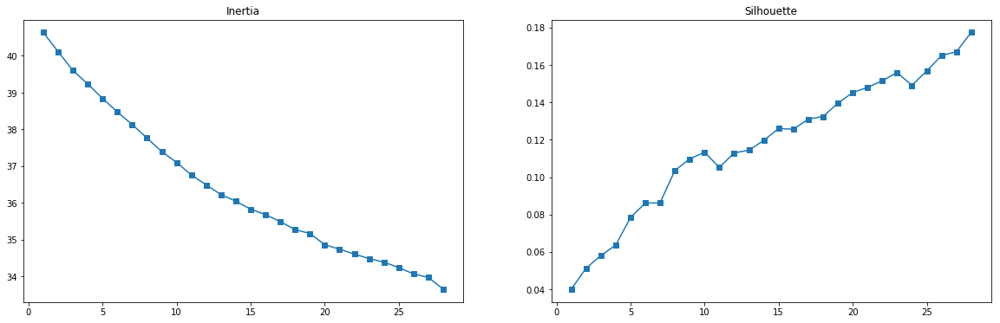

In [75]:
# Визуализируем изменение расстояния в кластерах - unertia и метрику силуэт
fig, ax = plt.subplots(1,2,figsize=(20,6))
ax[0].plot(range(1, len(inertia)+1), inertia, marker='s')
ax[0].set_title('Inertia')
ax[1].set_title('Silhouette')
ax[1].plot(range(1, len(metric)+1), metric, marker='s')
plt.show()

Видим, что где-то на 11 кластерах следует остановиться исходя из графиков<br>
потому что метрики начинают медленнее улучшаться, а слишком много клаcтеров для данной задачи не имеет смысла

In [91]:
# Смотрим примеры слов в кластерах
sentences = full_prep.copy()
sentences['cluster'] = cluster_labels
cluster_words(sentences,'cluster','prep_df')

{0: ('карта',
  'оплата',
  'магазин',
  'услуга',
  'организация',
  'центр',
  'государственный',
  'ремонт',
  'строительный',
  'оборудование'),
 1: ('автомобиль',
  'оплата',
  'карта',
  'автозапчасть',
  'магазин',
  'автотовары',
  'запчасть',
  'шиномонтаж',
  'автосервис',
  'автотехцентр'),
 2: ('компания',
  'звонок',
  'колл-центр',
  'немой',
  'телемаркетер',
  'нежелательный',
  'услуга',
  'финансовый',
  'страховой',
  'сервис'),
 3: ('маникюр',
  'женский',
  'педикюр',
  'цена',
  'стрижка',
  'мужской',
  'услуга',
  'салон',
  'красота',
  'парикмахерская'),
 4: ('сборщик',
  'задолженность',
  'злонамеренный',
  'вызов',
  'звонок',
  'колл-центр',
  'нежелательный',
  'немой',
  'финансовый',
  'услуга'),
 5: ('доставка',
  'еда',
  'оплата',
  'карта',
  'wi-fi',
  'кухня',
  'ценовой',
  'категория',
  'средний',
  'счет'),
 6: ('поликлиника',
  'детский',
  'взрослый',
  'клиника',
  'больница',
  'государственный',
  'организация',
  'стоматологический',
  '

### Affinity

In [92]:
aff = AffinityPropagation().fit(idf_vector)
cluster_labels = aff.labels_

In [94]:
# Смотрим кол-во кластеров
len(np.unique(cluster_labels))

342

In [95]:
print(f'silhouette = {silhouette_score(idf_vector,cluster_labels)}')
print(f'davies_bouldin = {davies_bouldin_score(idf_vector,cluster_labels)}')

silhouette = 0.2022395839834341
davies_bouldin = 1.5987995166357807


/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

divide by zero encountered in true_divide

/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

invalid value encountered in true_divide



AffinityPropagation пытается создать слишком много кластеров, для нашей задачи не подходит и способ <br> 
сбора в кластеры также не подходит для нашей задачи

### Spectral

In [96]:
spectral = SpectralClustering(n_clusters=30, random_state=20,
                                     affinity='nearest_neighbors').fit(idf_vector)
cluster_labels = spectral.labels_

/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/manifold/spectral_embedding_.py:237: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.



In [97]:
print(f'silhouette = {silhouette_score(idf_vector,cluster_labels)}')
print(f'davies_bouldin = {davies_bouldin_score(idf_vector,cluster_labels)}')

silhouette = 0.16094868631006684
davies_bouldin = 1.592967741357953


/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

divide by zero encountered in true_divide

/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

invalid value encountered in true_divide



SpectralClustering выбирает кластеры за счет близости и в итоге формирует маленькие обособленные кластеры, <br> 
для нашего распределения не подходит

### Agglomerative

In [130]:
aggl = AgglomerativeClustering(n_clusters=38).fit(idf_vector)
cluster_labels = aggl.labels_

In [131]:
print(f'silhouette = {silhouette_score(idf_vector,cluster_labels)}')
print(f'davies_bouldin = {davies_bouldin_score(idf_vector,cluster_labels)}')

silhouette = 0.1987045255715289
davies_bouldin = 2.051682308019318


/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

divide by zero encountered in true_divide

/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

invalid value encountered in true_divide



In [33]:
# Строим график метрики от кол-ва кластеров
siluete = []
for i in tqdm.tqdm_notebook(range(5,100)):
    aggl_ = AgglomerativeClustering(n_clusters=i).fit(idf_vector)
    siluete.append(silhouette_score(idf_vector,aggl_.labels_))

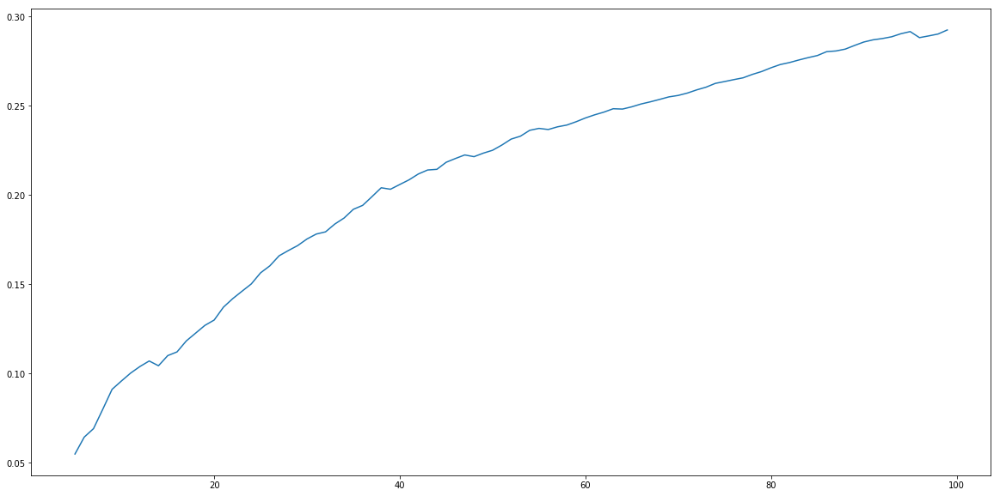

In [55]:
plt.figure(figsize=(20,10))
plt.plot(range(5, len(siluete)+5), siluete)
#plt.xticks(range(5,len(siluete)+5))

Из графика видно, что метрика ничинает медленней расти после ~38 кластеров

In [99]:
# Строим дендограмму 
distance_mat = pdist(idf_vector) # pdist посчитает нам верхний треугольник матрицы попарных расстояний

Z = hierarchy.linkage(distance_mat, 'single') # linkage — реализация агломеративного алгоритма


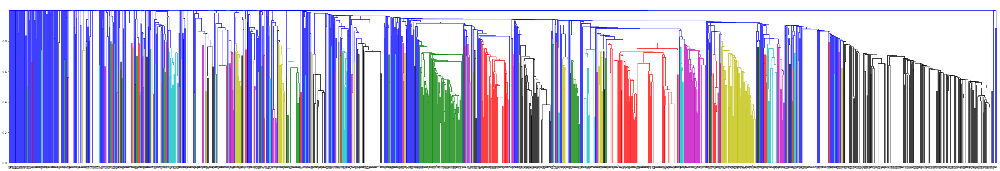

In [100]:
plt.figure(figsize=(60, 10))
dn = hierarchy.dendrogram(Z, color_threshold=0.8)

По ней можно приблизительно посмотреть,что ~40 кластеров будут уместны в данной задаче

### DBSCAN

In [105]:
dbscan = DBSCAN(n_jobs=-1, min_samples=10).fit(idf_vector)
cluster_labels = dbscan.labels_

In [106]:
np.unique(cluster_labels)

array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
       16, 17, 18, 19, 20, 21])

In [108]:
print(f'silhouette = {silhouette_score(idf_vector,cluster_labels)}')
print(f'davies_bouldin = {davies_bouldin_score(idf_vector,cluster_labels)}')

silhouette = 0.06301494804569323
davies_bouldin = 1.1184882292784826


/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

divide by zero encountered in true_divide

/home/dmitriy/anaconda3/lib/python3.7/site-packages/sklearn/metrics/cluster/unsupervised.py:342: RuntimeWarning:

invalid value encountered in true_divide



Данный алгоритм совсем не подходит, так как работает на основе плотности распределения <br>
а в данном случае
данные разряженные

## Visualizing

In [29]:
# Используем метод главных компонент для уменьшения размерности
pca = PCA(n_components=3, random_state=20).fit(idf_vector)
idf_pca = pca.transform(idf_vector)

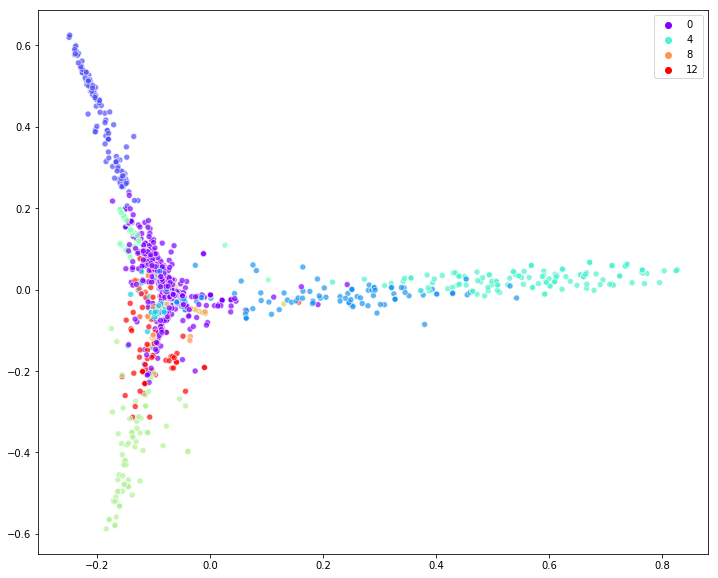

In [129]:
# И визулизируем кластеризацию (изображено k-means)
plt.figure(figsize=(12,10))
sns.scatterplot(idf_pca[:,0],idf_pca[:,1],hue=cluster_labels,palette='rainbow', alpha=0.7)#,legend='full')

In [31]:
# Используем метод t-sne для уменьшения размерности
tsne = TSNE(random_state=20)
X_tsne = tsne.fit_transform(idf_vector)

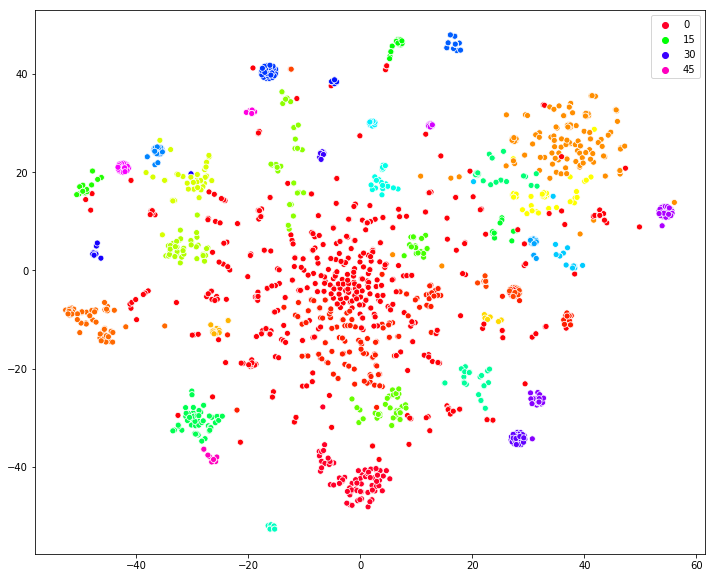

In [132]:
# И визулизируем кластеризацию (изображено agglomerative)
plt.figure(figsize=(12,10))
sns.scatterplot(X_tsne[:,0],X_tsne[:,1],hue=cluster_labels,palette='gist_rainbow')#,legend='full')

t-sne лучше визуализирует данное распределение

In [113]:
cf.go_offline()

In [126]:
# Визуализируем в 3d с текстами для каждого вектора
def vizualise_clustering_3d(idf_pca):
    df_pca = pd.DataFrame(idf_pca,columns=['0','1','2'])
    df_pca['cluster'] = cluster_labels
    df_pca['cluster'] = df_pca['cluster'].astype('str')
    df_pca['text'] = full_prep['prep_df'].apply(' '.join).values

    df_pca.iplot(kind='scatter3d',x='0',y='1',z='2',size=5,mode='markers',categories='cluster',
                 title='Cufflinks - Scatter 3D Chart',opacity=1, text='text',
                 dimensions=(900,700))#,colors=['blue','pink','green'])

In [122]:
# с помощью PCA
pca_3 = PCA(n_components=3, random_state=20).fit(idf_vector)
idf_pca_3 = pca_3.transform(idf_vector)

In [127]:
# Изображено для k-means
vizualise_clustering_3d(idf_pca_3)

In [115]:
# с помощью t-sne
tsne_3 = TSNE(random_state=20,n_components=3)
X_tsne_3 = tsne_3.fit_transform(idf_vector)

In [133]:
# Изображено для agglomerative
vizualise_clustering_3d(X_tsne_3)

В итоге у меня получилось что для данного распределения лучше всего работают методы: <br>
k-means с 11 кластерами и <br>
аггломеративная кластеризация с 38 кластерами <br>
<br>
Выбирал на основе метрики силуэт, разумного кол-ва кластеров и визуализации разбиения